# FIFA PLAYER EDA

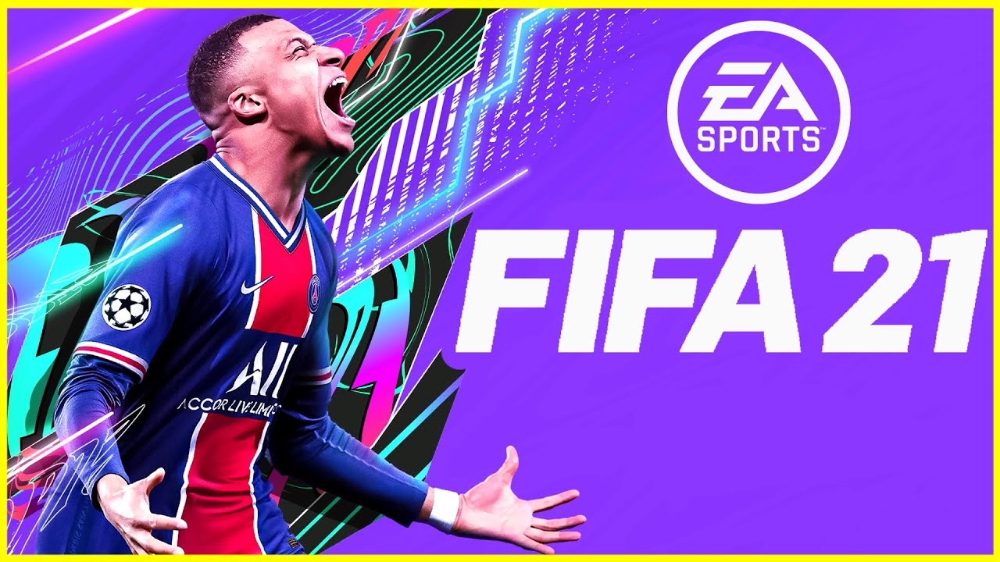

## PROJECT DESCRIPTION

#### This project concentrates on Exploratory data analysis, data cleaning and visualization with plotly. The dataset includes the player data from FIFA 20. The data allows comparison of same players across different versions of the game. NumPy, Pandas and Plotly libraries could be of use for this project. EDA is done using many factors such as overall rating, wages and many more agilities of players. Scatter plots and Radar charts are plotted in support of EDA. Apart from EDA, recommendations are provided in picking top players for every position based on some constraints. This analysis helps in finding out the best fit players according to the user and help in creating the best team with his/her constraints.  


### Data Analysis

In [81]:
import pandas as pd #Importing Libraries for EDA and Visualization
import numpy as np
import plotly
import plotly.graph_objects as go
import plotly.express as px

In [82]:
data = pd.read_csv('players_20.csv') #Reading csv file 

In [83]:
data.head() # Displaying first 5 rows of the data file

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


In [84]:
data.shape # To check no of rows and columns 

(18278, 104)

In [85]:
#picking only required columns for EDA
useful_columns=['height_cm','short_name','nationality', 'club', 'overall', 'potential', 'value_eur', 'wage_eur', 'player_positions', 'preferred_foot','weak_foot', 'skill_moves', 'work_rate', 'body_type','pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed', 'gk_positioning','attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy','mentality_interceptions', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure','defending_standing_tackle', 'defending_sliding_tackle','goalkeeping_handling','goalkeeping_reflexes', 'ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb']
len(useful_columns)

66

In [86]:
Final_data = data[useful_columns]
Final_data.shape
Final_data.head()

,height_cm,short_name,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,170,L. Messi,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,187,Cristiano Ronaldo,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,175,Neymar Jr,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,188,J. Oblak,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,175,E. Hazard,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


In [87]:
Final_data.columns #printing all the columns names for simplifying EDA

Index(['height_cm', 'short_name', 'nationality', 'club', 'overall',
       'potential', 'value_eur', 'wage_eur', 'player_positions',
       'preferred_foot', 'weak_foot', 'skill_moves', 'work_rate', 'body_type',
       'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic',
       'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed',
       'gk_positioning', 'attacking_short_passing', 'attacking_volleys',
       'skill_dribbling', 'skill_curve', 'skill_fk_accuracy',
       'mentality_interceptions', 'mentality_positioning', 'mentality_vision',
       'mentality_penalties', 'mentality_composure',
       'defending_standing_tackle', 'defending_sliding_tackle',
       'goalkeeping_handling', 'goalkeeping_reflexes', 'ls', 'st', 'rs', 'lw',
       'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm',
       'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb',
       'rb'],
      dtype='object')

### Data Cleaning

In [88]:
Final_data[['short_name','player_positions']] #checking for players' positons

,short_name,player_positions
0,L. Messi,"RW, CF, ST"
1,Cristiano Ronaldo,"ST, LW"
2,Neymar Jr,"LW, CAM"
3,J. Oblak,GK
4,E. Hazard,"LW, CF"
...,...,...
18273,Shao Shuai,CB
18274,Xiao Mingjie,CB
18275,Zhang Wei,CM
18276,Wang Haijian,CM


In [89]:
#Gets all positions of players by giving 1 or 0 values for overall positions
player_position = Final_data['player_positions'].str.get_dummies(sep=',')#Gets all positions of players by giving 1 or 0 values for overall positions
player_position.head()

,CAM,CB,CDM,CF,CM,LB,LM,LW,LWB,RB,...,GK,LB,LM,LW,LWB,RB,RM,RW,RWB,ST
0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [90]:
Final_data =  Final_data.drop('player_positions',axis=1) #Dropping player_positions column from Final_data

In [91]:
Final_data =  pd.concat([Final_data,player_position],axis = 1) # Concating player_postion and Final_data columns
Final_data.shape

(18278, 94)

In [92]:
#Manupulating data in the following columns
position_names = ['ls', 'st', 'rs', 'lw','lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm','rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb','rb']
Final_data[position_names].head()

,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,83+3,83+3,83+3,89+3,88+3,88+3,88+3,89+3,89+3,89+3,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


In [93]:
position_sum=Final_data[position_names].fillna('0+0') #Replacing Nan values with 0's 
position_sum.head()

,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,0+0,0+0,0+0,0+0,0+0,0+0,0+0,0+0,0+0,0+0,...,0+0,0+0,0+0,0+0,0+0,0+0,0+0,0+0,0+0,0+0
4,83+3,83+3,83+3,89+3,88+3,88+3,88+3,89+3,89+3,89+3,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


In [94]:
position_sum.isnull().sum() #Checking for 'Nan' Values

ls     0
st     0
rs     0
lw     0
lf     0
cf     0
rf     0
rw     0
lam    0
cam    0
ram    0
lm     0
lcm    0
cm     0
rcm    0
rm     0
lwb    0
ldm    0
cdm    0
rdm    0
rwb    0
lb     0
lcb    0
cb     0
rcb    0
rb     0
dtype: int64

In [95]:
#Summing both the values in each column 
for col in position_names:
    fst_t=position_sum[col].str.split('+',n=1,expand = True)[0]
    snd_t=position_sum[col].str.split('+',n=1,expand = True)[1]
    position_sum[col]=fst_t.astype(int)+snd_t.astype(int)
position_sum[position_names]

,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,91,91,91,95,95,95,95,95,95,95,...,70,68,68,68,70,65,54,54,54,65
1,94,94,94,92,93,93,93,92,91,91,...,68,64,64,64,68,64,56,56,56,64
2,87,87,87,93,92,92,92,93,93,93,...,69,64,64,64,69,64,49,49,49,64
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,86,86,86,92,91,91,91,92,92,92,...,69,66,66,66,69,64,52,52,52,64
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,34,34,34,33,33,33,33,33,33,33,...,45,44,44,44,45,47,48,48,48,47
18274,35,35,35,35,34,34,34,35,35,35,...,46,45,45,45,46,48,49,49,49,48
18275,45,45,45,45,45,45,45,45,46,46,...,49,51,51,51,49,49,51,51,51,49
18276,45,45,45,47,46,46,46,47,48,48,...,50,50,50,50,50,50,51,51,51,50


In [96]:
Final_data =  Final_data.drop(position_names,axis=1) #Dropping position_names to get rid of "87+2" kind of values

In [97]:
Final_data =  pd.concat([Final_data,position_sum],axis = 1) #Concating the summed up columns to the Final data
Final_data.head()

,height_cm,short_name,nationality,club,overall,potential,value_eur,wage_eur,preferred_foot,weak_foot,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,170,L. Messi,Argentina,FC Barcelona,94,94,95500000,565000,Left,4,...,70,68,68,68,70,65,54,54,54,65
1,187,Cristiano Ronaldo,Portugal,Juventus,93,93,58500000,405000,Right,4,...,68,64,64,64,68,64,56,56,56,64
2,175,Neymar Jr,Brazil,Paris Saint-Germain,92,92,105500000,290000,Right,5,...,69,64,64,64,69,64,49,49,49,64
3,188,J. Oblak,Slovenia,Atlético Madrid,91,93,77500000,125000,Right,3,...,0,0,0,0,0,0,0,0,0,0
4,175,E. Hazard,Belgium,Real Madrid,91,91,90000000,470000,Right,4,...,69,66,66,66,69,64,52,52,52,64


In [98]:
#Taking selected columns from the Final data for the overall Player Analysis
overall_attributes = ['dribbling','defending','physic','passing','shooting','pace', 'weak_foot', 'skill_moves','mentality_composure','attacking_short_passing','skill_dribbling']
Final_data[overall_attributes]

,dribbling,defending,physic,passing,shooting,pace,weak_foot,skill_moves,mentality_composure,attacking_short_passing,skill_dribbling
0,96.0,39.0,66.0,92.0,92.0,87.0,4,4,96,92,97
1,89.0,35.0,78.0,82.0,93.0,90.0,4,5,95,83,89
2,95.0,32.0,58.0,87.0,85.0,91.0,5,5,94,87,96
3,NaN,NaN,NaN,NaN,NaN,NaN,3,1,68,43,12
4,94.0,35.0,66.0,86.0,83.0,91.0,4,4,91,89,95
...,...,...,...,...,...,...,...,...,...,...,...
18273,33.0,47.0,51.0,28.0,23.0,57.0,3,2,41,35,24
18274,35.0,48.0,48.0,33.0,24.0,58.0,2,2,35,43,32
18275,45.0,48.0,51.0,44.0,35.0,54.0,2,2,39,53,40
18276,47.0,45.0,52.0,47.0,35.0,59.0,2,2,40,54,42


In [99]:
Final_data[overall_attributes].isnull().sum() #Checking for null values

dribbling                  2036
defending                  2036
physic                     2036
passing                    2036
shooting                   2036
pace                       2036
weak_foot                     0
skill_moves                   0
mentality_composure           0
attacking_short_passing       0
skill_dribbling               0
dtype: int64

In [100]:
# Filling the null values with median value in its respective columns
for col in overall_attributes:
    Final_data[overall_attributes] = Final_data[overall_attributes].fillna(Final_data[col].median())
Final_data[overall_attributes]

,dribbling,defending,physic,passing,shooting,pace,weak_foot,skill_moves,mentality_composure,attacking_short_passing,skill_dribbling
0,96.0,39.0,66.0,92.0,92.0,87.0,4,4,96,92,97
1,89.0,35.0,78.0,82.0,93.0,90.0,4,5,95,83,89
2,95.0,32.0,58.0,87.0,85.0,91.0,5,5,94,87,96
3,64.0,64.0,64.0,64.0,64.0,64.0,3,1,68,43,12
4,94.0,35.0,66.0,86.0,83.0,91.0,4,4,91,89,95
...,...,...,...,...,...,...,...,...,...,...,...
18273,33.0,47.0,51.0,28.0,23.0,57.0,3,2,41,35,24
18274,35.0,48.0,48.0,33.0,24.0,58.0,2,2,35,43,32
18275,45.0,48.0,51.0,44.0,35.0,54.0,2,2,39,53,40
18276,47.0,45.0,52.0,47.0,35.0,59.0,2,2,40,54,42


In [101]:
#Selecting Goalkeeper Attributes from Final Data
goalkeeper_attr=['gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed','gk_positioning']
Final_data[goalkeeper_attr].head()

,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning
0,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN
3,87.0,92.0,78.0,89.0,52.0,90.0
4,NaN,NaN,NaN,NaN,NaN,NaN


In [102]:
# Replacing 'Nan' with 0
goalkeepers=Final_data[goalkeeper_attr].fillna('0')
goalkeepers.head()

,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning
0,0,0,0,0,0,0
1,0,0,0,0,0,0
2,0,0,0,0,0,0
3,87,92,78,89,52,90
4,0,0,0,0,0,0


In [103]:
Final_data =  Final_data.drop(goalkeeper_attr,axis=1)

In [104]:
Final_data =  pd.concat([Final_data,goalkeepers],axis = 1)
Final_data.head()

,height_cm,short_name,nationality,club,overall,potential,value_eur,wage_eur,preferred_foot,weak_foot,...,lcb,cb,rcb,rb,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning
0,170,L. Messi,Argentina,FC Barcelona,94,94,95500000,565000,Left,4,...,54,54,54,65,0,0,0,0,0,0
1,187,Cristiano Ronaldo,Portugal,Juventus,93,93,58500000,405000,Right,4,...,56,56,56,64,0,0,0,0,0,0
2,175,Neymar Jr,Brazil,Paris Saint-Germain,92,92,105500000,290000,Right,5,...,49,49,49,64,0,0,0,0,0,0
3,188,J. Oblak,Slovenia,Atlético Madrid,91,93,77500000,125000,Right,3,...,0,0,0,0,87,92,78,89,52,90
4,175,E. Hazard,Belgium,Real Madrid,91,91,90000000,470000,Right,4,...,52,52,52,64,0,0,0,0,0,0


In [105]:
#Selecting Defenders Attributes from Final Data
defender_attr=['defending','physic','mentality_interceptions', 'mentality_positioning','pace']
Final_data[defender_attr].head()

,defending,physic,mentality_interceptions,mentality_positioning,pace
0,39.0,66.0,40,94,87.0
1,35.0,78.0,29,95,90.0
2,32.0,58.0,36,87,91.0
3,64.0,64.0,19,11,64.0
4,35.0,66.0,41,87,91.0


In [106]:
Final_data[defender_attr].isnull().sum() #Checking for null values

defending                  0
physic                     0
mentality_interceptions    0
mentality_positioning      0
pace                       0
dtype: int64

In [107]:
#Selecting Midfielders Attributes from Final Data
midfielders_attr=['mentality_vision','mentality_composure','attacking_short_passing','skill_dribbling']
Final_data[midfielders_attr].head()

,mentality_vision,mentality_composure,attacking_short_passing,skill_dribbling
0,94,96,92,97
1,82,95,83,89
2,90,94,87,96
3,65,68,43,12
4,89,91,89,95


In [108]:
Final_data[midfielders_attr].isnull().sum()

mentality_vision           0
mentality_composure        0
attacking_short_passing    0
skill_dribbling            0
dtype: int64

In [109]:
Final_data = Final_data.fillna(0) #Final Check for null values before going to EDA

In [110]:
Final_data.isnull().sum()

height_cm         0
short_name        0
nationality       0
club              0
overall           0
                 ..
gk_handling       0
gk_kicking        0
gk_reflexes       0
gk_speed          0
gk_positioning    0
Length: 94, dtype: int64

### EDA

In [111]:
#Radar Chart Function. It is used for comparing any two players individually against each other. 

from math import pi
import matplotlib.pyplot as plt
def RadarChart(player, player2):
    Attributes = ["pace","shooting","passing","dribbling","defending","physic"] #columns selected for comparing
    data=[]
    for A in Attributes:
        x=Final_data[Final_data.short_name==player][A].tolist()[0] # inputing Player 1 data for corresponding columns
        data.append(x)
    data.append(data[0])
    
    data2=[]
    for A in Attributes:
        x=Final_data[Final_data.short_name==player2][A].tolist()[0] # inputing Player 2 data for corresponding columns
        data2.append(x)
    data2.append(data2[0])
    
    angles = [n / 6 * 2 * pi for n in range(6)]
    angles += angles [:1]
    
    angles2 = [n / 6 * 2 * pi for n in range(6)]
    angles2 += angles2 [:1]
    plt.figure(dpi=125)
    ax = plt.subplot(111, polar=True)
    ax = plt.subplot(111, polar=True)
    
    plt.xticks(angles[:-1],Attributes)

    ax.plot(angles,data)
    ax.fill(angles, data, 'blue', alpha=0.1)

    ax.plot(angles2,data2)
    ax.fill(angles2, data2, 'orange', alpha=0.1)

    plt.figtext(0.1,0.98,player,color="blue")
    plt.figtext(0.1,0.94,"vs")
    plt.figtext(0.1,0.9,player2,color="orange")
    
    plt.show()

In [112]:
#Scatter plot for Overall rating Vs Value. Marker is used for quick look on player name, rating and value in the plot
fig = go.Figure(data=go.Scatter(x=Final_data['overall'],y=Final_data['value_eur'],mode='markers',marker=dict(size=10,showscale=True),text=Final_data['short_name']))
fig.update_layout(title='Scatter Plot for Overall Rating v Value in Euros',xaxis_title='Overall Rating',yaxis_title='Value in Euros')
fig.show()

In [113]:
#Summing all the striker attributes columns and printing it in a new column
#Concatinating this column to the Final Data for EDA
striker_attr=['ls', 'st', 'rs','shooting']
Final_data[striker_attr].head()
Sum=0
for attr in striker_attr:
    Sum = Final_data[attr]+Sum
Final_data['striker_overall_rating']=Sum

In [114]:
# Scatter plot for Overall rating Vs Value of Strikers alone. 
# Marker is used for quick look on player name, rating and value in the plot
fig = go.Figure(data=go.Scatter(x=Final_data['striker_overall_rating'],y=Final_data['value_eur'],mode='markers',marker=dict(size=10,showscale=True),text=Final_data['short_name']))
fig.update_layout(title='Scatter Plot for Overall Rating v Value in Euros',xaxis_title='striker overall rating',yaxis_title='Value in Euros')
fig.show()

In [115]:
#Picking up top 50 players based on the strikers scatter plot and sorted based on the rating
columns=['short_name','striker_overall_rating','value_eur']
striker_data = Final_data[columns]
s = striker_data.sort_values(by=['striker_overall_rating','value_eur'],ascending=False)
print(s.head(50))

            short_name  striker_overall_rating  value_eur
1    Cristiano Ronaldo                   375.0   58500000
0             L. Messi                   365.0   95500000
19           L. Suárez                   362.0   53000000
17           S. Agüero                   360.0   60000000
12             H. Kane                   358.0   83000000
20      R. Lewandowski                   354.0   64500000
10           K. Mbappé                   351.0   93500000
22        A. Griezmann                   350.0   69000000
34           E. Cavani                   350.0   47000000
100            G. Bale                   348.0   37500000
9             M. Salah                   347.0   80500000
39             S. Mané                   347.0   62000000
2            Neymar Jr                   346.0  105500000
38       P. Aubameyang                   346.0   57000000
96      Z. Ibrahimović                   346.0   14000000
43              H. Son                   344.0   60000000
37            

<ipython-input-111-6e4711728f75>:26: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



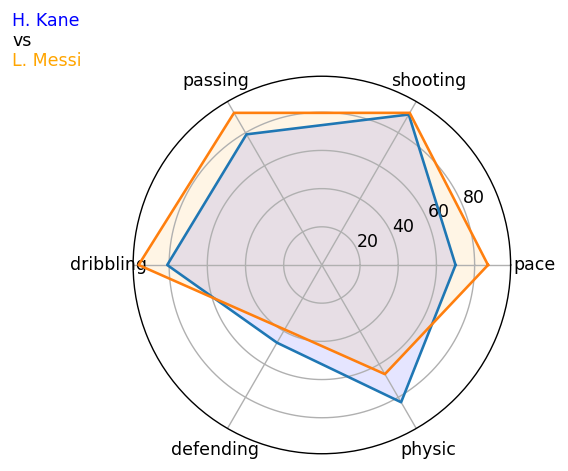

In [129]:
RadarChart('H. Kane','L. Messi')    

In [116]:
#Summing all the Attacking Midfielders attributes columns and printing it in a new column
#Concatinating this column to the Final Data for EDA
attack_midfielders=['passing', 'dribbling','shooting','mentality_vision','lam', 'cam', 'ram']
print(Final_data[attack_midfielders].head())
Sum=0
for attr in attack_midfielders:
    Sum = Final_data[attr]+Sum
Final_data['attack_midfielders_rating']=Sum

   passing  dribbling  shooting  mentality_vision  lam  cam  ram
0     92.0       96.0      92.0                94   95   95   95
1     82.0       89.0      93.0                82   91   91   91
2     87.0       95.0      85.0                90   93   93   93
3     64.0       64.0      64.0                65    0    0    0
4     86.0       94.0      83.0                89   92   92   92


In [117]:
# Scatter plot for Overall rating Vs Value of Atacking Midefielders alone. 
# Marker is used for quick look on player name, rating and value in the plot
fig = go.Figure(data=go.Scatter(x=Final_data['attack_midfielders_rating'],y=Final_data['value_eur'],mode='markers',marker=dict(size=10,showscale=True),text=Final_data['short_name']))
fig.update_layout(title='Scatter Plot for Overall Rating v Value in Euros',xaxis_title='attack_midfielders_rating',yaxis_title='Value in Euros')
fig.show()

In [118]:
#Picking up top 50 players based on the Attacking Midfielders scatter plot and sorted based on the rating
columns=['short_name','attack_midfielders_rating','value_eur']
atkmid_data = Final_data[columns]
a = atkmid_data.sort_values(by=['attack_midfielders_rating','value_eur'],ascending=False)
print(a.head(50))

            short_name  attack_midfielders_rating  value_eur
0             L. Messi                      659.0   95500000
2            Neymar Jr                      636.0  105500000
5         K. De Bruyne                      631.0   90000000
4            E. Hazard                      628.0   90000000
1    Cristiano Ronaldo                      619.0   58500000
22        A. Griezmann                      615.0   69000000
27          C. Eriksen                      614.0   68000000
54          L. Insigne                      614.0   52000000
37             M. Reus                      612.0   56000000
8            L. Modrić                      612.0   45000000
9             M. Salah                      610.0   80500000
23           P. Dybala                      610.0   76500000
33         David Silva                      606.0   36000000
68            Coutinho                      604.0   46500000
106       J. Rodríguez                      603.0   40500000
17           S. Agüero  

In [119]:
#Summing all the Defending Midfielders attributes columns and printing it in a new column
#Concatinating this column to the Final Data for EDA
defending_midfielders=['passing','defending', 'physic','mentality_interceptions', 'mentality_positioning','lm', 'lcm', 'cm', 'rcm','rm', 'ldm', 'cdm', 'rdm']
print(Final_data[defending_midfielders].head())
Sum=0
for attr in defending_midfielders:
    Sum = Final_data[attr]+Sum
Final_data['defending_midfielders_rating']=Sum

   passing  defending  physic  mentality_interceptions  mentality_positioning  \
0     92.0       39.0    66.0                       40                     94   
1     82.0       35.0    78.0                       29                     95   
2     87.0       32.0    58.0                       36                     87   
3     64.0       64.0    64.0                       19                     11   
4     86.0       35.0    66.0                       41                     87   

   lm  lcm  cm  rcm  rm  ldm  cdm  rdm  
0  94   89  89   89  94   68   68   68  
1  91   84  84   84  91   64   64   64  
2  92   85  85   85  92   64   64   64  
3   0    0   0    0   0    0    0    0  
4  92   86  86   86  92   66   66   66  


In [120]:
# Scatter plot for Overall rating Vs Value of Defending Midefielders alone. 
# Marker is used for quick look on player name, rating and value in the plot
fig = go.Figure(data=go.Scatter(x=Final_data['defending_midfielders_rating'],y=Final_data['value_eur'],mode='markers',marker=dict(size=10,showscale=True),text=Final_data['short_name']))
fig.update_layout(title='Scatter Plot for Overall Rating v Value in Euros',xaxis_title='defending_midfielders_rating',yaxis_title='Value in Euros')
fig.show()

In [121]:
#Picking up top 50 players based on the Defending Midfielders scatter plot and sorted based on the rating
columns=['short_name','defending_midfielders_rating','value_eur']
defmid_data = Final_data[columns]
d = defmid_data.sort_values(by=['defending_midfielders_rating','value_eur'],ascending=False)
print(d.head(50))

              short_name  defending_midfielders_rating  value_eur
15              N. Kanté                        1100.0   66000000
107                Allan                        1100.0   38000000
142             A. Vidal                        1097.0   23500000
212        R. Nainggolan                        1095.0   22500000
21       Sergio Busquets                        1092.0   55000000
61            J. Kimmich                        1089.0   48000000
8              L. Modrić                        1086.0   45000000
105                 Koke                        1086.0   40500000
101              Marcelo                        1084.0   28000000
51            Jordi Alba                        1075.0   40000000
102            A. Witsel                        1074.0   31500000
5           K. De Bruyne                        1072.0   90000000
81               Fabinho                        1072.0   45000000
147             Paulinho                        1072.0   29000000
44        

In [122]:
#Summing all the Defenders attributes columns and printing it in a new column
#Concatinating this column to the Final Data for EDA
defenders=['pace','defending', 'physic','defending_standing_tackle', 'defending_sliding_tackle','lb', 'lcb', 'cb', 'rcb','rb']
print(Final_data[defenders].head())
Sum=0
for attr in defenders:
    Sum = Final_data[attr]+Sum
Final_data['defenders_rating']=Sum

   pace  defending  physic  defending_standing_tackle  \
0  87.0       39.0    66.0                         37   
1  90.0       35.0    78.0                         32   
2  91.0       32.0    58.0                         26   
3  64.0       64.0    64.0                         12   
4  91.0       35.0    66.0                         27   

   defending_sliding_tackle  lb  lcb  cb  rcb  rb  
0                        26  65   54  54   54  65  
1                        24  64   56  56   56  64  
2                        29  64   49  49   49  64  
3                        18   0    0   0    0   0  
4                        22  64   52  52   52  64  


In [123]:
# Scatter plot for Overall rating Vs Value of Defenders alone. 
# Marker is used for quick look on player name, rating and value in the plot
fig = go.Figure(data=go.Scatter(x=Final_data['defenders_rating'],y=Final_data['value_eur'],mode='markers',marker=dict(size=10,showscale=True),text=Final_data['short_name']))
fig.update_layout(title='Scatter Plot for Overall Rating v Value in Euros',xaxis_title='defenders_rating',yaxis_title='Value in Euros')
fig.show()

In [124]:
#Picking up top 50 players based on the Defenders scatter plot and sorted based on the rating
columns=['short_name','defenders_rating','value_eur']
def_data = Final_data[columns]
f = def_data.sort_values(by=['defenders_rating','value_eur'],ascending=False)
print(f.head(50))

           short_name  defenders_rating  value_eur
7         V. van Dijk             868.0   78000000
18       Sergio Ramos             861.0   31500000
15           N. Kanté             856.0   66000000
11       K. Koulibaly             851.0   67500000
16       G. Chiellini             845.0   24500000
142          A. Vidal             844.0   23500000
107             Allan             843.0   38000000
114      L. Hernández             841.0   37500000
90         K. Manolas             839.0   37500000
103       Alex Sandro             839.0   33000000
148         K. Walker             839.0   25500000
56         Marquinhos             837.0   51500000
76          R. Varane             837.0   45000000
40         A. Laporte             836.0   56500000
59          S. Umtiti             835.0   50000000
35           D. Godín             835.0   28000000
212     R. Nainggolan             835.0   22500000
42           Casemiro             834.0   53500000
50    T. Alderweireld          

In [125]:
#Summing all the Goalkeepers attributes columns and printing it in a new column
#Concatinating this column to the Final Data for EDA
goalk_attr=['gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed','gk_positioning','goalkeeping_handling', 'goalkeeping_reflexes']
print(Final_data[goalk_attr].head())
Sum=0
for attr in goalk_attr:
    Sum = Final_data[attr].astype(int)+Sum
Final_data['goalkeeper_rating']=Sum

  gk_diving gk_handling gk_kicking gk_reflexes gk_speed gk_positioning  \
0         0           0          0           0        0              0   
1         0           0          0           0        0              0   
2         0           0          0           0        0              0   
3        87          92         78          89       52             90   
4         0           0          0           0        0              0   

   goalkeeping_handling  goalkeeping_reflexes  
0                    11                     8  
1                    11                    11  
2                     9                    11  
3                    92                    89  
4                    12                     8  


In [126]:
# Scatter plot for Overall rating Vs Value of Goalkeepers alone. 
# Marker is used for quick look on player name, rating and value in the plot
fig = go.Figure(data=go.Scatter(x=Final_data['goalkeeper_rating'],y=Final_data['value_eur'],mode='markers',marker=dict(size=10,showscale=True),text=Final_data['short_name']))
fig.update_layout(title='Scatter Plot for Overall Rating v Value in Euros',xaxis_title='goalkeeper_rating',yaxis_title='Value in Euros')
fig.show()

In [127]:
#List of top Goalkeepers

columns=['short_name','goalkeeper_rating','value_eur']
gk_data = Final_data[columns]
g = gk_data.sort_values(by=['goalkeeper_rating','value_eur'],ascending=False)
print(g.head(50))

           short_name  goalkeeper_rating  value_eur
3            J. Oblak                669   77500000
25            Ederson                668   54500000
31           M. Neuer                668   32000000
14             De Gea                666   56000000
6       M. ter Stegen                659   67500000
13            Alisson                657   58000000
32          H. Lloris                650   36000000
86           A. Lopes                648   33500000
30      S. Handanovič                647   26000000
28        T. Courtois                643   48000000
53           K. Navas                642   30500000
87         P. Gulácsi                636   31000000
248          A. Onana                635   22000000
137         Y. Sommer                635   21000000
74      G. Donnarumma                634   41500000
60        W. Szczęsny                633   37500000
122           B. Leno                633   26000000
88           R. Bürki                631   32000000
206     K. S

<ipython-input-111-6e4711728f75>:26: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



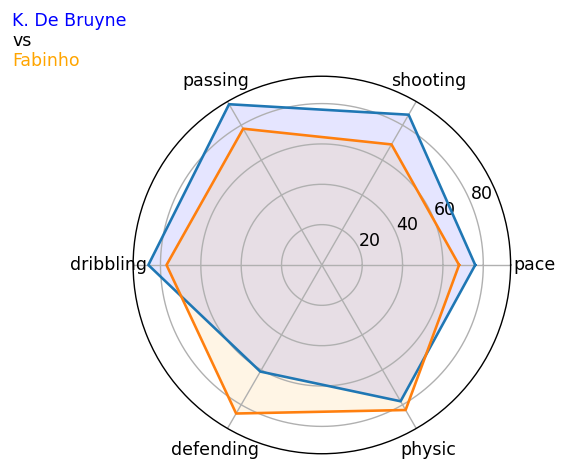

In [128]:
#Comparing players from above lists and choosing the best amongst the lot as per the user wishes too.
#User can compare players in all the categories and pick best players for their respective 

RadarChart('K. De Bruyne','Fabinho')      